<center><img src="https://i.imgur.com/zRrFdsf.png" width="700"></center>

## The First GDF

With the help of **geopandas** and GitHub, we will bring the **Spain comunities**

Declaramos variables en base a España y sus comunidades.

In [77]:
import geopandas as gpd

linkGitSession='https://github.com/SPAIN-trabajo-CDE/Spain-Maps/raw/main/'
linkEspAndComunidades='gadm41_ESP_shp.zip'

fullLinkEspAndComunidades=linkGitSession+linkEspAndComunidades
EspAndComunidades=gpd.read_file(fullLinkEspAndComunidades)

/usr/local/lib/python3.13/dist-packages/pyogrio/geopandas.py:382: UserWarning: More than one layer found in 'gadm41_ESP_shp.zip': 'gadm41_ESP_0' (default), 'gadm41_ESP_1', 'gadm41_ESP_2'. Specify layer parameter to avoid this warning.
  result = read_func(


We have the GDF. Let's visit it:

In [78]:

type(EspAndComunidades)

geopandas.geodataframe.GeoDataFrame

In [79]:
# dimensions
EspAndComunidades.shape

(1, 3)

In [80]:
# names
EspAndComunidades.columns

Index(['GID_0', 'COUNTRY', 'geometry'], dtype='object')

In [81]:
# any missing values?
EspAndComunidades[EspAndComunidades.isna().any(axis=1)]

,GID_0,COUNTRY,geometry


In [82]:
# data types in the GDF
EspAndComunidades.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   GID_0     1 non-null      object  
 1   COUNTRY   1 non-null      object  
 2   geometry  1 non-null      geometry
dtypes: geometry(1), object(2)
memory usage: 156.0+ bytes


In [83]:
# some content
EspAndComunidades.head()

,GID_0,COUNTRY,geometry
0,ESP,Spain,"MULTIPOLYGON (((-17.96319 27.69042, -17.96319 ..."


All the previous commands exist and work the same if you had a DF from pandas. But now we have a new column type: **geometry**, and we can have some extra functions from _geopandas_:

In [84]:
# what geometry?
EspAndComunidades.geom_type.unique()

array(['MultiPolygon'], dtype=object)

As we have polygons, we know the map is about country borders:

<Axes: >

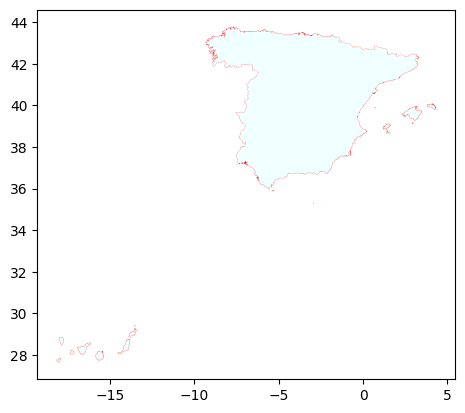

In [85]:
EspAndComunidades.plot(facecolor="azure",#color of polygon fill
               edgecolor='red', #color of border
               linewidth=0.1) #thickness of lines

## More GDFs

Let's open the other maps:

Mapa de las comunidades de España GDF

In [86]:
linkComunidadesAuto = 'Mapas%20extraidos/gadm41_ESP_1.shp'

fullLinkComunidadesAuto = linkGitSession + linkComunidadesAuto

comunidades = gpd.read_file(fullLinkComunidadesAuto)

This is the cities map:

You can start by creating the **base** layer, and add other maps, as layers, on top: and plot the map

<Axes: >

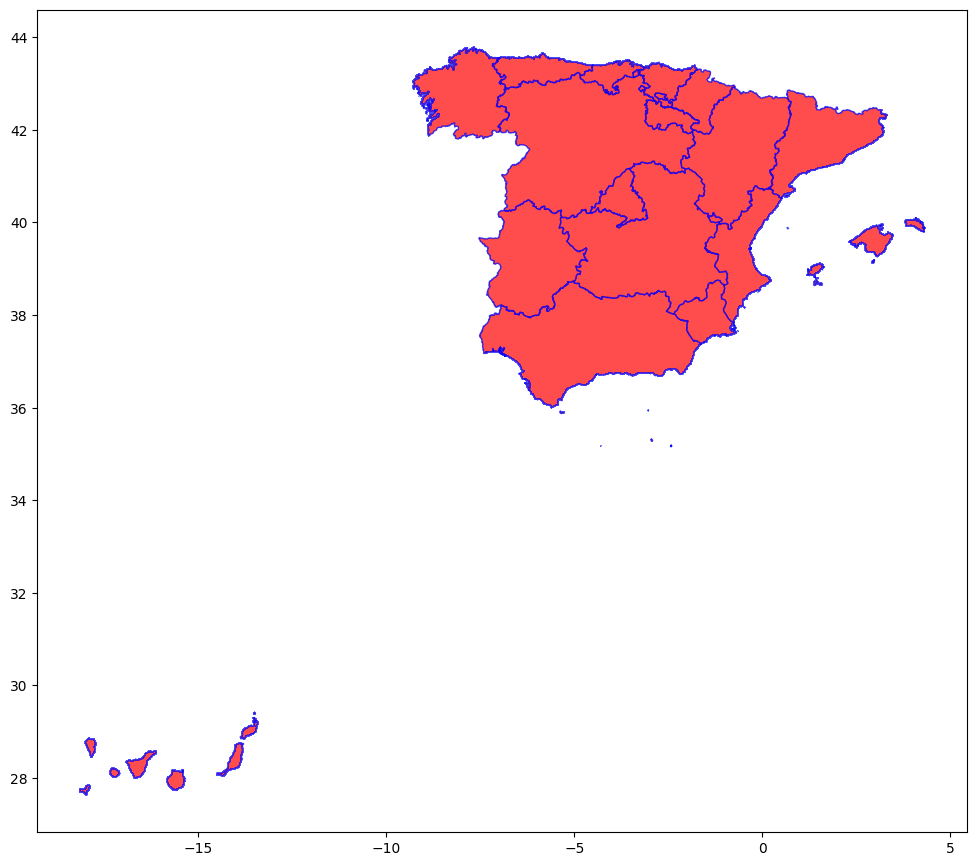

In [87]:
base = EspAndComunidades.plot(facecolor="white",
                      edgecolor='black',
                      linewidth=0.1,
                      figsize=(12,12))


comunidades.plot(marker='.', edgecolor='blue', color='red', markersize=1,alpha=0.7,
            ax=base)



# The Map Projection

We know the reality is at least in 3D, so on this screen and on piece of paper we should alter reality so the earth or parts of it can be seen in a meaningful way.

Let's find out about the way the maps we have are represented in 2D:

In [88]:
EspAndComunidades.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [89]:
comunidades.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In all the previous cases, you see a common CRS (EPSG 4326), and also that their axes are in **long** / **lat** (measured in *degrees*). The map is **NOT projected**.


In [90]:
Spain=EspAndComunidades[EspAndComunidades.COUNTRY=='Spain']

Dates Spain

In [91]:
Spain.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [92]:
Spain.crs.axis_info[0].unit_name, Spain.crs.axis_info[1].unit_name

('degree', 'degree')

Spain is pojected?

In [93]:
Spain.crs.is_projected

False

Determinamos el centroide de España

In [94]:
Spain.centroid

/tmp/ipykernel_838/2718033987.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Spain.centroid


,0
0,POINT (-3.64706 40.2269)


Ploteo del mapa de España con el centroide de color rojo

/tmp/ipykernel_838/2459756014.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Spain.centroid.plot(ax=base,color='red')


<Axes: >

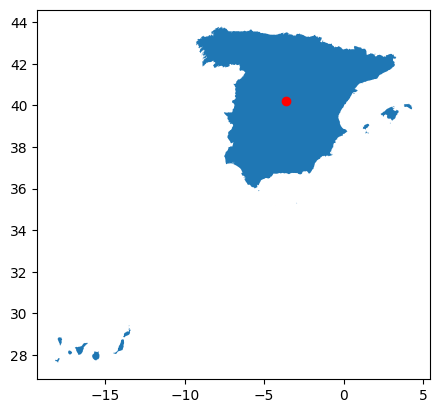

In [95]:
base=Spain.plot()
Spain.centroid.plot(ax=base,color='red')

## Reprojecting

A projected CRS will have units in meters or feet (or similar). You can request a EPSG per country [here](https://epsg.io/?q=Spain+kind%3APROJCRS), but also debating with AI is good alternative. Recomendación de  la web y consulta

In [96]:
# recommended from website
Spain.to_crs(5634).crs.axis_info[0].unit_name, Spain.to_crs(5634).crs.axis_info[1].unit_name

('metre', 'metre')

In [97]:
# now this works with no warning
Spain.to_crs(5634).centroid

,0
0,POINT (2857171.01 1628196.848)


El crs projectado de España fue cambiao a 3035

In [98]:
# recommended from Gemini - after a long chat!
Spain.to_crs(3035).crs.axis_info[0].unit_name,Spain.to_crs(3035).crs.axis_info[1].unit_name

('metre', 'metre')

Centroide projected at cr(3035)

In [99]:
# no warning either!
Spain.to_crs(3035).centroid

,0
0,POINT (3155763.515 2006018.974)


Let's plot! Ploteo Mapa projectado

/tmp/ipykernel_838/1583130323.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Spain.centroid.plot(color='red',ax=base5880)


<Axes: >

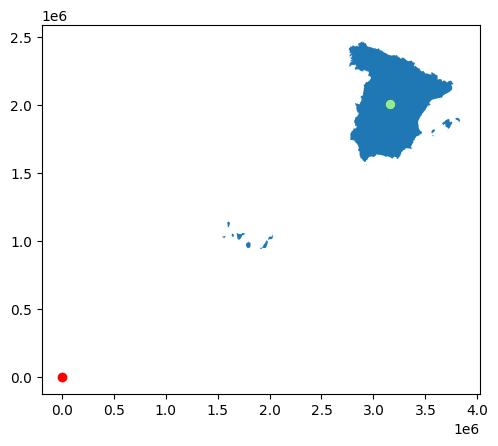

In [100]:
# replotting:

base5880=Spain.to_crs(3035).plot()
Spain.to_crs(3035).centroid.plot(color='black',ax=base5880)
Spain.to_crs(3035).centroid.plot(color='lightgreen',ax=base5880)
Spain.centroid.plot(color='red',ax=base5880)

Let's keep the **EPSG: 3035**  for the the comunities and the country (SPAIN)
Guardamos la variable de Spain projected, para su uso luego

In [101]:
Spain_3035=Spain.to_crs(3035)
comunidades_Spain_3035=comunidades[comunidades.COUNTRY=='Spain'].to_crs(3035)

#Import DF
Archivo que contiene las variables a utilizar


In [102]:
import pandas as pd

linkGitSession='https://github.com/SPAIN-trabajo-CDE/Spain-Maps/raw/main/'
someDataLink='Data/PoblacionComunidadesAutonomas.csv'

someData=pd.read_csv(linkGitSession+someDataLink, sep=';', engine='python')

## data available
someData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   comunidad   18 non-null     object
 1   poblacion   18 non-null     int64 
 2   superficie  18 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 564.0+ bytes


Muestra la información del DF

In [103]:
someData.head()

,comunidad,poblacion,superficie
0,Andalucía,8676713,8759886
1,Aragón,1364621,4773965
2,"Asturias, Principado de",1015128,106057
3,"Balears, Illes",1249844,49917
4,Canarias,2258866,744558


Show the column "comunities as NAME_1:" para GDF

In [104]:
comunidades_Spain_3035.NAME_1.head()

,NAME_1
0,Andalucía
1,Aragón
2,Cantabria
3,Castilla-La Mancha
4,Castilla y León


Show the column "comunities as comunidad:" para DF

In [105]:
someData.comunidad.head()

,comunidad
0,Andalucía
1,Aragón
2,"Asturias, Principado de"
3,"Balears, Illes"
4,Canarias


MUestra el GDF, la cabecera

In [106]:
print(comunidades_Spain_3035.columns)
display(comunidades_Spain_3035.head())

Index(['GID_1', 'GID_0', 'COUNTRY', 'NAME_1', 'VARNAME_1', 'NL_NAME_1',
       'TYPE_1', 'ENGTYPE_1', 'CC_1', 'HASC_1', 'ISO_1', 'geometry'],
      dtype='object')


,GID_1,GID_0,COUNTRY,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,ISO_1,geometry
0,ESP.1_1,ESP,Spain,Andalucía,Andalousie|Andaluc¡a|Andalusien|,NA,Comunidad Autónoma,Autonomous Community,01,ES.AN,NA,"MULTIPOLYGON (((3140224.434 1531298.763, 31402..."
1,ESP.2_1,ESP,Spain,Aragón,Aragão|Aragó|Aragón|Aragona|Arag,NA,Comunidad Autónoma,Autonomous Community,15,ES.AR,NA,"POLYGON ((3394510.47 1933341.623, 3394857.557 ..."
2,ESP.3_1,ESP,Spain,Cantabria,Cantàbria|Cantábria|Cantabrie|Ka,NA,Comunidad Autónoma,Autonomous Community,06,ES.CB,ES-CB,"MULTIPOLYGON (((3186946.783 2305680.547, 31868..."
3,ESP.4_1,ESP,Spain,Castilla-La Mancha,Castela-La Mancha|Castela-Mancha,NA,Comunidad Autónoma,Autonomous Community,08,ES.CM,ES-CM,"MULTIPOLYGON (((3320725.971 1797144.007, 33194..."
4,ESP.5_1,ESP,Spain,Castilla y León,Castile and Leon|Castela e Leão|,NA,Comunidad Autónoma,Autonomous Community,07,ES.CL,NA,"MULTIPOLYGON (((2995681.931 2042242.654, 29957..."


Observando las columnas, `NAME_1` en `comunidades_Spain_3035` parece ser el nombre de la comunidad autónoma. Así que podemos hacer el merge usando `NAME_1` de `comunidades_Spain_3035` y `comunidad` de `someData`.

In [107]:
comunidades_Spain_3035.rename(columns={'NAME_1':'comunidad'},inplace=True)

Buscamos coincidencia entre ambas columnas comunidad.

In [108]:
onlyDF=set(someData.comunidad)- set(comunidades_Spain_3035.comunidad)
onlyGDF=set(comunidades_Spain_3035.comunidad)- set(someData.comunidad)

Coincidencia no encoontradas para el DF

In [109]:
onlyDF

{'Asturias, Principado de',
 'Balears, Illes',
 'Canarias',
 'Castilla - La Mancha',
 'Comunitat Valenciana',
 'Madrid, Comunidad de',
 'Murcia, Región de',
 'Navarra, Comunidad Foral de',
 'Rioja, La'}

Instalacion the fuzz merging

In [110]:
!pip install thefuzz

Extraemos los que tienen mejor resultado de coincidencia

In [111]:
from thefuzz.process import extractOne as mejor

In [112]:
mejor('Asturias, Principado de',onlyGDF)

('Principado de Asturias', 95)

In [113]:
[(comunidad, mejor(comunidad,onlyGDF)) for comunidad in onlyDF]

[('Canarias', ('Islas Canarias', 90)),
 ('Comunitat Valenciana', ('Comunidad Valenciana', 90)),
 ('Navarra, Comunidad Foral de', ('Comunidad Foral de Navarra', 95)),
 ('Rioja, La', ('La Rioja', 95)),
 ('Balears, Illes', ('Islas Baleares', 77)),
 ('Asturias, Principado de', ('Principado de Asturias', 95)),
 ('Castilla - La Mancha', ('Castilla-La Mancha', 95)),
 ('Madrid, Comunidad de', ('Comunidad de Madrid', 95)),
 ('Murcia, Región de', ('Región de Murcia', 95))]

In [114]:
[(comunidad, mejor(comunidad,onlyGDF)[0],mejor(comunidad,onlyGDF)[1]) for comunidad in onlyDF]

[('Canarias', 'Islas Canarias', 90),
 ('Comunitat Valenciana', 'Comunidad Valenciana', 90),
 ('Navarra, Comunidad Foral de', 'Comunidad Foral de Navarra', 95),
 ('Rioja, La', 'La Rioja', 95),
 ('Balears, Illes', 'Islas Baleares', 77),
 ('Asturias, Principado de', 'Principado de Asturias', 95),
 ('Castilla - La Mancha', 'Castilla-La Mancha', 95),
 ('Madrid, Comunidad de', 'Comunidad de Madrid', 95),
 ('Murcia, Región de', 'Región de Murcia', 95)]

In [115]:
pd.DataFrame([(comunidad, mejor(comunidad,onlyGDF)[0],mejor(comunidad,onlyGDF)[1]) for comunidad in onlyDF])

,0,1,2
0,Canarias,Islas Canarias,90
1,Comunitat Valenciana,Comunidad Valenciana,90
2,"Navarra, Comunidad Foral de",Comunidad Foral de Navarra,95
3,"Rioja, La",La Rioja,95
4,"Balears, Illes",Islas Baleares,77
5,"Asturias, Principado de",Principado de Asturias,95
6,Castilla - La Mancha,Castilla-La Mancha,95
7,"Madrid, Comunidad de",Comunidad de Madrid,95
8,"Murcia, Región de",Región de Murcia,95


In [116]:
pd.DataFrame([(comunidad, mejor(comunidad,onlyGDF)[0],mejor(comunidad,onlyGDF)[1]) for comunidad in onlyDF]).sort_values(by=2)

,0,1,2
4,"Balears, Illes",Islas Baleares,77
0,Canarias,Islas Canarias,90
1,Comunitat Valenciana,Comunidad Valenciana,90
2,"Navarra, Comunidad Foral de",Comunidad Foral de Navarra,95
3,"Rioja, La",La Rioja,95
5,"Asturias, Principado de",Principado de Asturias,95
6,Castilla - La Mancha,Castilla-La Mancha,95
7,"Madrid, Comunidad de",Comunidad de Madrid,95
8,"Murcia, Región de",Región de Murcia,95


In [117]:
onlyDF=set(someData.comunidad)- set(comunidades_Spain_3035.comunidad)
onlyGDF=set(comunidades_Spain_3035.comunidad)- set(someData.comunidad)

In [118]:
pd.DataFrame([(comunidad, mejor(comunidad,onlyGDF)[0],mejor(comunidad,onlyGDF)[1]) for comunidad in onlyDF]).sort_values(2)

,0,1,2
4,"Balears, Illes",Islas Baleares,77
0,Canarias,Islas Canarias,90
1,Comunitat Valenciana,Comunidad Valenciana,90
2,"Navarra, Comunidad Foral de",Comunidad Foral de Navarra,95
3,"Rioja, La",La Rioja,95
5,"Asturias, Principado de",Principado de Asturias,95
6,Castilla - La Mancha,Castilla-La Mancha,95
7,"Madrid, Comunidad de",Comunidad de Madrid,95
8,"Murcia, Región de",Región de Murcia,95


In [119]:
changesToDF={comunidad: mejor(comunidad,onlyGDF)[0] for comunidad in onlyDF}
changesToDF

{'Canarias': 'Islas Canarias',
 'Comunitat Valenciana': 'Comunidad Valenciana',
 'Navarra, Comunidad Foral de': 'Comunidad Foral de Navarra',
 'Rioja, La': 'La Rioja',
 'Balears, Illes': 'Islas Baleares',
 'Asturias, Principado de': 'Principado de Asturias',
 'Castilla - La Mancha': 'Castilla-La Mancha',
 'Madrid, Comunidad de': 'Comunidad de Madrid',
 'Murcia, Región de': 'Región de Murcia'}

In [120]:
someData.replace(to_replace={'comunidad':changesToDF},inplace=True)

Coincidnecia entre todos los datos de las columnas comunidad

In [121]:
onlyDF=set(someData.comunidad)- set(comunidades_Spain_3035.comunidad)
onlyGDF=set(comunidades_Spain_3035.comunidad)- set(someData.comunidad)
[(comunidad, mejor(comunidad,onlyGDF)) for comunidad in onlyDF]

[]

In [122]:
theMapAndData=comunidades_Spain_3035.merge(someData, on='comunidad')

In [123]:
theMapAndData.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   GID_1       18 non-null     object  
 1   GID_0       18 non-null     object  
 2   COUNTRY     18 non-null     object  
 3   comunidad   18 non-null     object  
 4   VARNAME_1   18 non-null     object  
 5   NL_NAME_1   18 non-null     object  
 6   TYPE_1      18 non-null     object  
 7   ENGTYPE_1   18 non-null     object  
 8   CC_1        18 non-null     object  
 9   HASC_1      18 non-null     object  
 10  ISO_1       18 non-null     object  
 11  geometry    18 non-null     geometry
 12  poblacion   18 non-null     int64   
 13  superficie  18 non-null     int64   
dtypes: geometry(1), int64(2), object(11)
memory usage: 2.1+ KB


In [124]:
theMapAndData.to_file("worldindicators.json")

#Mapas Temáticos

Thematics: the DDM (Dot Density Map)

Pltoeo de España

<Axes: >

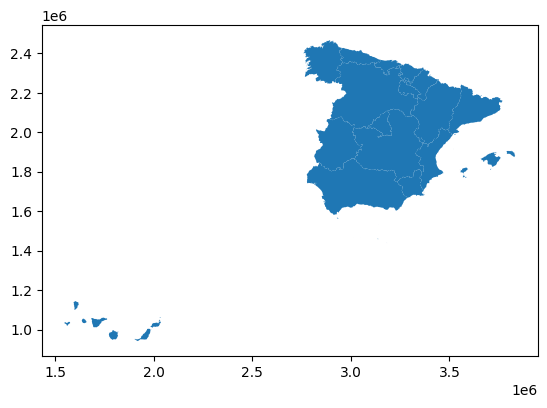

In [125]:
Spain=theMapAndData
Spain.plot()

Creamos unna copia de Spain, asignamos un valor numero al numero de puntos, respecto a la columna poblacion

In [126]:
justDots=Spain.copy()
dot_value = 10000
justDots['num_dots'] = (justDots['poblacion'] / dot_value).astype(int)

In [127]:
justDots = justDots.sample_points(size=justDots['num_dots']).explode(index_parts=True)

Se muestra la cantidad de puntos

In [128]:
justDots

0   0      POINT (2791349.216 1767939.697)
    1      POINT (2828826.564 1820072.809)
    2      POINT (2915216.639 1803879.926)
    3      POINT (3169476.221 1670835.266)
    4       POINT (2860129.391 1703167.34)
                        ...               
17  153     POINT (3331453.45 1769547.187)
    154     POINT (3316604.61 1708535.447)
    155    POINT (3299069.883 1675597.912)
    156    POINT (3317690.758 1759368.237)
    157     POINT (3270617.743 1702079.62)
Name: sampled_points, Length: 4904, dtype: geometry

Información de los puntos


In [129]:
type(justDots)

geopandas.geoseries.GeoSeries

In [130]:
justDots.reset_index(drop=True, inplace=True)
Spain_dots=gpd.GeoDataFrame(geometry=justDots)
Spain_dots

,geometry
0,POINT (2791349.216 1767939.697)
1,POINT (2828826.564 1820072.809)
2,POINT (2915216.639 1803879.926)
3,POINT (3169476.221 1670835.266)
4,POINT (2860129.391 1703167.34)
...,...
4899,POINT (3331453.45 1769547.187)
4900,POINT (3316604.61 1708535.447)
4901,POINT (3299069.883 1675597.912)
4902,POINT (3317690.758 1759368.237)


In [131]:
Spain_dots.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4904 entries, 0 to 4903
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  4904 non-null   geometry
dtypes: geometry(1)
memory usage: 38.4 KB


Ploteo de la comunidades de España, respecto el número de puntos

<Axes: >

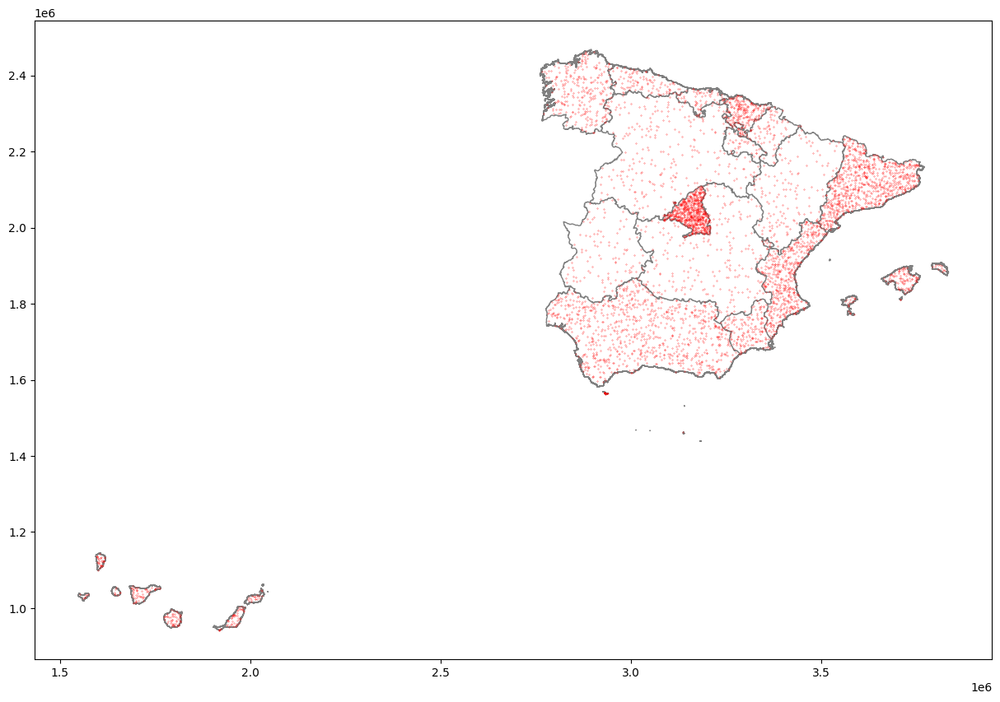

In [132]:
base=Spain.plot(facecolor="white",#color of polygon fill
               edgecolor='grey', figsize=(15,15)) #color of border
Spain_dots.plot(markersize=0.05, color='red',ax=base)

<Axes: >

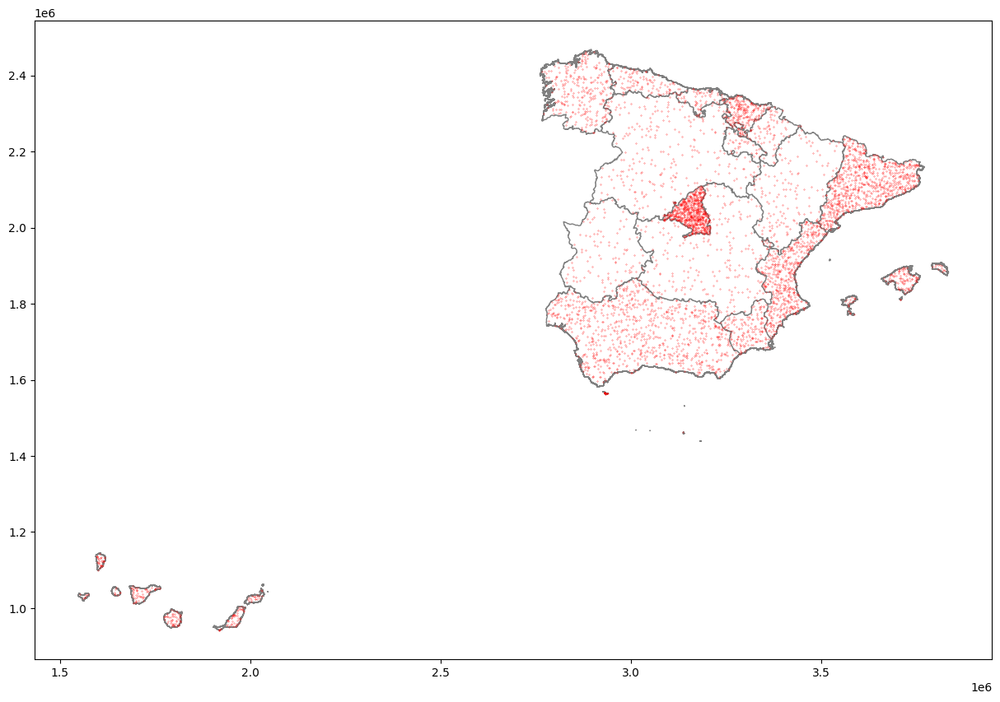

In [133]:
base=Spain.to_crs(3035).plot(facecolor="white",
                              edgecolor='grey', figsize=(15,15))
Spain_dots.to_crs(3035).plot(markersize=0.05, color='red',ax=base)

-----------------------------------------------------------------------

In [134]:
Spain_3035=Spain.to_crs(3035)
Spain_dots_3035=Spain_dots.to_crs(3035)

-----------------------------------------------------------------------

** Thematics: the PSM (Proportional Symbol Map)**

In [135]:
Spain_3035_centroids =Spain_3035.copy()

Spain_3035_centroids ['geometry'] = Spain_3035_centroids ['geometry'].centroid

In [136]:
Spain_3035_centroids['size'] = Spain_3035_centroids['poblacion'].apply(lambda x: x**0.5/100)

## or
# import numpy as np
# Africa_8857_centroids['size'] = Africa_8857_centroids['population'].apply(lambda x: np.log10(x))

Ploteo mapa respecto el centroide de cada comunidad

<Axes: >

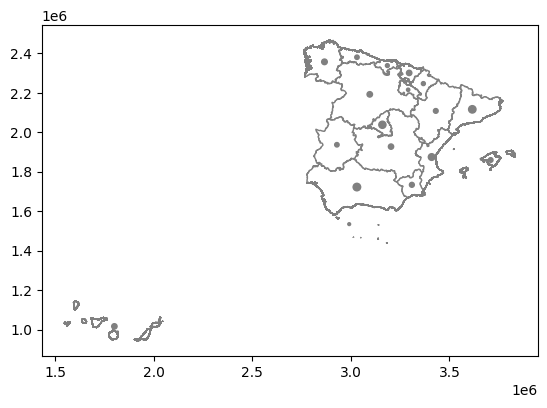

In [137]:
base=Spain_3035.plot(facecolor="white",
                      edgecolor='grey')
# Plot the centroids on top
Spain_3035_centroids.plot(
    ax=base,
    markersize=Spain_3035_centroids['size'],
    color='grey'
)

In [138]:
Spain_3035_centroids["geometry"]=Spain_3035.representative_point()

In [139]:
base=Spain_3035[Spain_3035.comunidad=="SEYCHELLES"].explore()
Spain_3035_centroids[Spain_3035_centroids.comunidad=="SEYCHELLES"].explore(m=base,color="red")

/tmp/ipykernel_838/3671911659.py:1: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  base=Spain_3035[Spain_3035.comunidad=="SEYCHELLES"].explore()
/tmp/ipykernel_838/3671911659.py:2: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  Spain_3035_centroids[Spain_3035_centroids.comunidad=="SEYCHELLES"].explore(m=base,color="red")


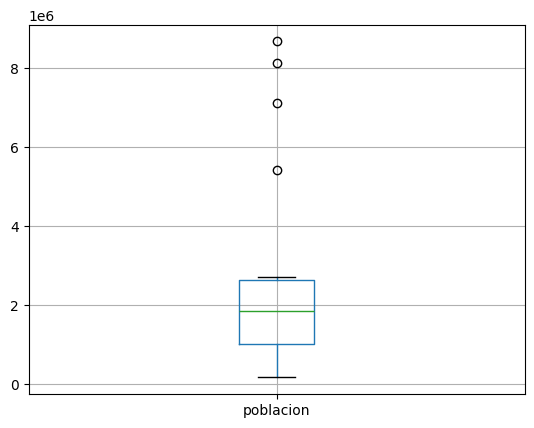

In [140]:
boxplotInfo=Spain_3035_centroids.boxplot(column='poblacion',return_type="dict")

In [141]:
outliers=boxplotInfo['fliers'][0].get_ydata()
## see
outliers

array([8676713, 8124126, 7113886, 5425182], dtype=object)

In [142]:
Spain_3035_centroids[Spain_3035_centroids.poblacion.isin(outliers)]

,GID_1,GID_0,COUNTRY,comunidad,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,ISO_1,geometry,poblacion,superficie,size
0,ESP.1_1,ESP,Spain,Andalucía,Andalousie|Andaluc¡a|Andalusien|,NA,Comunidad Autónoma,Autonomous Community,01,ES.AN,NA,POINT (3046686.377 1725094.994),8676713,8759886,29.456261
5,ESP.6_1,ESP,Spain,Cataluña,Catalogna|Catalogne|Catalonia|Ca,NA,Comunidad Autónoma,Autonomous Community,09,ES.CT,NA,POINT (3635556.961 2114311.038),8124126,3211265,28.502852
7,ESP.8_1,ESP,Spain,Comunidad de Madrid,Madrid|Communauté de Madrid| Com,NA,Comunidad Autónoma,Autonomous Community,NA,ES.MD,NA,POINT (3151197.199 2041295.352),7113886,802747,26.671869
9,ESP.10_1,ESP,Spain,Comunidad Valenciana,Valencia|Communauté de Valence|C,NA,Comunidad Autónoma,Autonomous Community,10,ES.VC,NA,POINT (3392293.942 1865493.33),5425182,2326523,23.292020


*Outliers*

In [143]:
Spain_3035_centroids['poblacion_outlier']=Spain_3035_centroids.poblacion.isin(outliers)*1

## see
Spain_3035_centroids

,GID_1,GID_0,COUNTRY,comunidad,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,ISO_1,geometry,poblacion,superficie,size,poblacion_outlier
0,ESP.1_1,ESP,Spain,Andalucía,Andalousie|Andaluc¡a|Andalusien|,NA,Comunidad Autónoma,Autonomous Community,01,ES.AN,NA,POINT (3046686.377 1725094.994),8676713,8759886,29.456261,1
1,ESP.2_1,ESP,Spain,Aragón,Aragão|Aragó|Aragón|Aragona|Arag,NA,Comunidad Autónoma,Autonomous Community,15,ES.AR,NA,POINT (3411304.949 2096170.821),1364621,4773965,11.681699,0
2,ESP.3_1,ESP,Spain,Cantabria,Cantàbria|Cantábria|Cantabrie|Ka,NA,Comunidad Autónoma,Autonomous Community,06,ES.CB,ES-CB,POINT (3181235.318 2328880.875),593623,53302,7.704693,0
3,ESP.4_1,ESP,Spain,Castilla-La Mancha,Castela-La Mancha|Castela-Mancha,NA,Comunidad Autónoma,Autonomous Community,08,ES.CM,ES-CM,POINT (3209386.652 1934088.398),2126378,7944744,14.582105,0
4,ESP.5_1,ESP,Spain,Castilla y León,Castile and Leon|Castela e Leão|,NA,Comunidad Autónoma,Autonomous Community,07,ES.CL,NA,POINT (3119986.869 2189702.374),2401221,9421691,15.495874,0
5,ESP.6_1,ESP,Spain,Cataluña,Catalogna|Catalogne|Catalonia|Ca,NA,Comunidad Autónoma,Autonomous Community,09,ES.CT,NA,POINT (3635556.961 2114311.038),8124126,3211265,28.502852,1
6,ESP.7_1,ESP,Spain,Ceuta y Melilla,NA,NA,Ciudad Autónoma,Autonomous City,19,ES.ML,NA,POINT (2931297.045 1565366.736),170634,3411,4.130787,0
7,ESP.8_1,ESP,Spain,Comunidad de Madrid,Madrid|Communauté de Madrid| Com,NA,Comunidad Autónoma,Autonomous Community,NA,ES.MD,NA,POINT (3151197.199 2041295.352),7113886,802747,26.671869,1
8,ESP.9_1,ESP,Spain,Comunidad Foral de Navarra,Communauté forale de Navarre|Com,NA,Comunidad Autónoma,Autonomous Community,15,ES.NA,NA,POINT (3359424.936 2239981.088),683854,1039216,8.269547,0
9,ESP.10_1,ESP,Spain,Comunidad Valenciana,Valencia|Communauté de Valence|C,NA,Comunidad Autónoma,Autonomous Community,10,ES.VC,NA,POINT (3392293.942 1865493.33),5425182,2326523,23.292020,1


<Axes: >

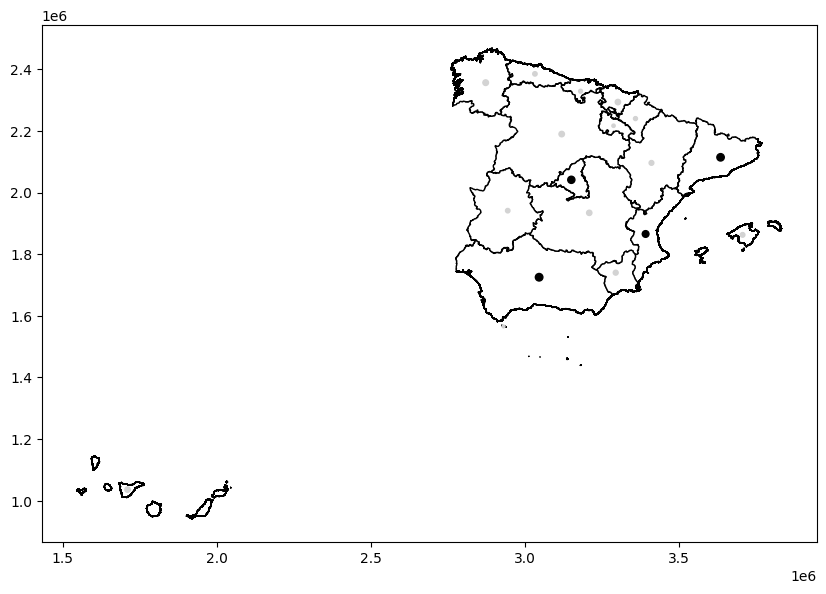

In [144]:
base = Spain_3035.plot(color='white', edgecolor='black', figsize=(10,10))

# Define your color map
mapcolor = {1: 'black', 0: 'lightgrey'}

# Plot the centroids on top
Spain_3035_centroids.plot(
    ax=base,
    markersize=Spain_3035_centroids['size'],
    color=Spain_3035_centroids['poblacion_outlier'].map(mapcolor)
)

In [145]:
Spain_3035_centroids_out = Spain_3035_centroids[Spain_3035_centroids.poblacion_outlier==1].copy()
Spain_3035_centroids_no_out = Spain_3035_centroids[Spain_3035_centroids.poblacion_outlier==0].copy()

In [146]:
Spain_3035_centroids_out['size'] = Spain_3035_centroids_out['poblacion'].apply(lambda x: x**0.5 / 50)
Spain_3035_centroids_no_out['size'] = Spain_3035_centroids_no_out['poblacion'].apply(lambda x: x**0.5 / 50)

Ploteo mapa final DDM

<Axes: >

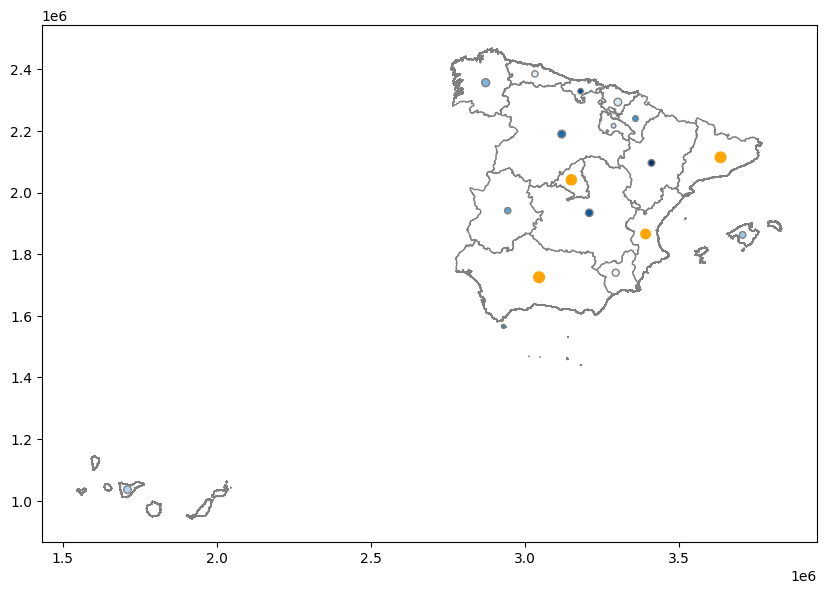

In [147]:
base=Spain_3035.plot(color='white', edgecolor='grey',figsize=(10,10))

Spain_3035_centroids_no_out.plot(
    ax=base,
    markersize=Spain_3035_centroids_no_out['size'],
    edgecolor='grey',
    c=Spain_3035_centroids_no_out['size'],
    cmap='Blues_r'
)
Spain_3035_centroids_out.plot(
    ax=base,
    markersize=Spain_3035_centroids_out['size'],
    color='orange'
)

MAPA TEMÁTICO. **CLOROPLETO**

No es un cloropleto aún

<Axes: >

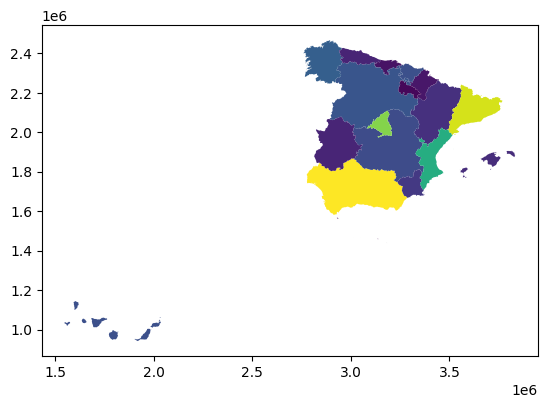

In [148]:
Spain_3035.plot(Spain_3035.poblacion)

Cloropleto

<Axes: >

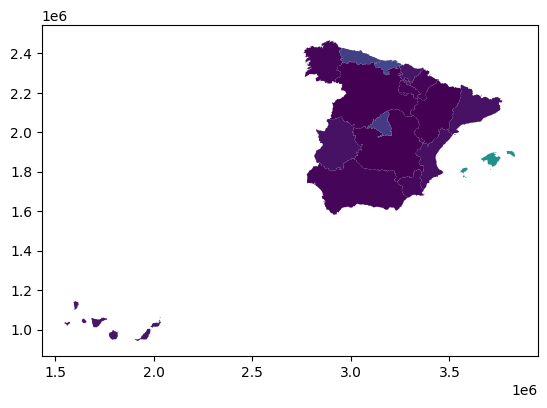

In [150]:
Spain_3035.plot(Spain_3035.poblacion/Spain_3035.superficie)

In [151]:
! pip show numba mapclassify numpy

Name: numba
Version: 0.61.2
Summary: compiling Python code using LLVM
Home-page: https://numba.pydata.org
Author: 
Author-email: 
License: BSD
Location: /usr/local/lib/python3.13/dist-packages
Requires: llvmlite, numpy
Required-by: librosa, pynndescent, pytensor, quantecon, segregation, shap, stumpy, umap-learn
---
Name: mapclassify
Version: 2.10.0
Summary: Classification Schemes for Choropleth Maps.
Home-page: 
Author: 
Author-email: 
License: BSD 3-Clause
Location: /usr/local/lib/python3.13/dist-packages
Requires: networkx, numpy, pandas, scikit-learn, scipy
Required-by: giddy, pysal, segregation, splot, spopt
---
Name: numpy
Version: 2.1.3
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2024, NumPy Developers.
 All rights reserved.

 Redistribution and use in source and binary forms, with or without
 modification, are permitted provided that the following conditions a

In [153]:
Spain_3035['poblacion_density']=Spain_3035.poblacion/Spain_3035.superficie

In [154]:
import mapclassify
import numpy as np

np.random.seed(12345) # so we all get the same results!

# let's try 5 intervals
K=5
theVar=Spain_3035['poblacion_density']
# same interval width, easy interpretation
ei5 = mapclassify.EqualInterval(theVar, k=K)
# same interval width based on standard deviation, easy - but not as the previous one, poor when high skewness
msd = mapclassify.StdMean(theVar)
# interval width varies, counts per interval are close, not easy to grasp, repeated values complicate cuts
q5=mapclassify.Quantiles(theVar,k=K)

# based on similarity, good for multimodal data
mb5 = mapclassify.MaximumBreaks(theVar, k=K)
# based on similarity, good for skewed data
ht = mapclassify.HeadTailBreaks(theVar) # no K needed
# based on similarity, optimizer
fj5 = mapclassify.FisherJenks(theVar, k=K)
# based on similarity, optimizer
jc5 = mapclassify.JenksCaspall(theVar, k=K)
# based on similarity, optimizer
mp5 = mapclassify.MaxP(theVar, k=K)

In [155]:
class5 = ei5,msd, q5,mb5,  ht, fj5, jc5, mp5
# Collect ADCM for each classifier
fits = np.array([ c.adcm for c in class5])
# Convert ADCM scores to a DataFrame
adcms = pd.DataFrame(fits)
# Add classifier names
adcms['classifier'] = [c.name for c in class5]
# Add column names to the ADCM
adcms.columns = ['ADCM', 'Classifier']

<Axes: ylabel='Classifier'>

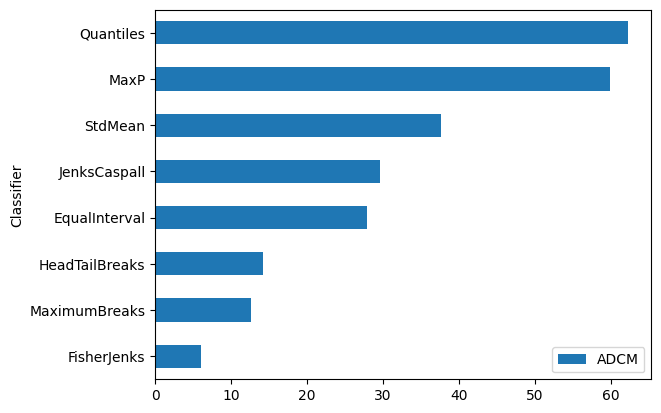

In [156]:
adcms.sort_values('ADCM').plot.barh(x='Classifier')

In [157]:
Spain_3035['poblacion_density_FJ5'] = fj5.yb

In [159]:
Spain_3035[['poblacion_density','poblacion_density_FJ5']].head(10)


,poblacion_density,poblacion_density_FJ5
0,0.990505,0
1,0.285846,0
2,11.136974,2
3,0.267646,0
4,0.254861,0
5,2.529883,1
6,50.024626,4
7,8.861928,2
8,0.658048,0
9,2.331884,1


In [160]:
newLabelsForLevels={0:"0_VeryLow", 1:"1_Low", 2:"2_Middle", 3:"3_High", 4:"4_VeryHigh"}

Spain_3035['poblacion_density_FJ5_cat']=Spain_3035.loc[:,'poblacion_density_FJ5'].replace(newLabelsForLevels)

# we have
Spain_3035[['poblacion_density','poblacion_density_FJ5','poblacion_density_FJ5_cat']].head(10)

,poblacion_density,poblacion_density_FJ5,poblacion_density_FJ5_cat
0,0.990505,0,0_VeryLow
1,0.285846,0,0_VeryLow
2,11.136974,2,2_Middle
3,0.267646,0,0_VeryLow
4,0.254861,0,0_VeryLow
5,2.529883,1,1_Low
6,50.024626,4,4_VeryHigh
7,8.861928,2,2_Middle
8,0.658048,0,0_VeryLow
9,2.331884,1,1_Low


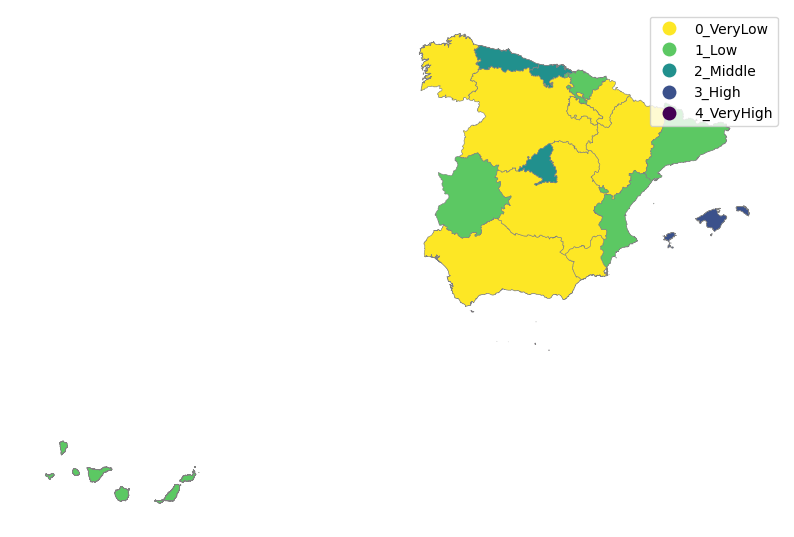

In [161]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(1, figsize=(10, 10))
Spain_3035.plot(column='poblacion_density_FJ5_cat', # variable to plot
                 cmap='viridis_r', # set of colors
                 categorical=True, # can be interpreted as category
                 edgecolor='grey', # border color
                 linewidth=0.4, # width of border
                 legend=True, # need a legend?
                 ax=ax
       )

ax.set_axis_off()

#SAVING as layers

In [162]:
Spain_3035.to_file("Spain_3035.gpkg",driver='GPKG',layer='continent')
Spain_dots_3035.to_file("Spain_3035.gpkg",driver='GPKG',layer='poblacion_ddm')
Spain_3035_centroids.to_file("Spain_3035.gpkg",driver='GPKG',layer='poblacion_psm')
Spain_3035_centroids_out.to_file("Spain_3035.gpkg",driver='GPKG',layer='outlier_poblacion_psm')
Spain_3035_centroids_no_out.to_file("Spain_3035.gpkg",driver='GPKG',layer='no_outlier_poblacion_psm')